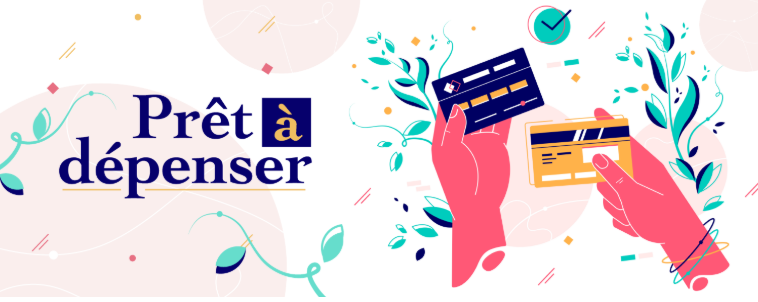

# 1 - Introduction - Import librairies & check versions

In [1]:
# %load_ext pycodestyle_magic
# %pycodestyle_on
# %pycodestyle_off

In [2]:
# utilities
import sys
import os
from joblib import load

# data transformation
import numpy as np
import pandas as pd

# model & data drift
import evidently
from evidently import ColumnMapping
from evidently.metric_preset import TargetDriftPreset, DataDriftPreset
from evidently.report import Report
from evidently.metrics import  DataDriftTable
from evidently.metrics import ClassificationQualityByClass 
from evidently.metrics import ClassificationQualityMetric 
from evidently.metrics.base_metric import generate_column_metrics
from evidently.metrics import ColumnCorrelationsMetric 
from evidently.metrics import ColumnSummaryMetric 



# set dataframe display options
pd.set_option('max_colwidth', None)
pd.set_option('display.max_columns', None)

# remove scientific notation
pd.set_option('display.float_format', lambda x: '%.5f' % x)


import streamlit as st

print("Librairies versions : \n")
print("numpy -", np.__version__)
print("pandas -", pd.__version__)
print("python -", sys.version[0:6])
print("evidently -", evidently.__version__)

np.seterr(divide='ignore', invalid='ignore')

Librairies versions : 

numpy - 2.0.2
pandas - 2.2.3
python - 3.10.7
evidently - 0.6.6


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

**Note python downgraded to version 3.10.7 due to evidently compatibility issued with more recent versions. Run with Jupyter Notebook kernel Python_310 only.**

**- Import training data and predictions:**

In [3]:
X_train = pd.read_csv('X_train_final.csv')
X_test = pd.read_csv('X_test_final.csv')
X_val = pd.read_csv('X_val_final.csv')
print(X_train.shape)
print(X_test.shape)
print(X_val.shape)

(215257, 56)
(46127, 56)
(46127, 56)


In [4]:
y_train = pd.read_csv('y_train_final.csv')
y_test = pd.read_csv('y_test_final.csv')
y_val = pd.read_csv('y_val_final.csv')
print(y_train.shape)
print(y_test.shape)
print(y_val.shape)

(215257, 1)
(46127, 1)
(46127, 1)


In [5]:
y_train_val_pred = pd.read_csv('y_train_val_pred.csv')
y_test_pred = pd.read_csv('y_test_pred.csv')
print(y_train_val_pred.shape)
print(y_test_pred.shape)

(261384, 1)
(46127, 1)


**- Import test data and predictions:**

In [6]:
test_data = pd.read_csv('test_data_final.csv').drop(labels=['Unnamed: 0'], axis=1)
print(test_data.shape)
test_data.head()

(48744, 56)


,NAME_CONTRACT_TYPE,INCOME_TYPE,EMPLOYMENT_SECTOR,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMAIL,REGION_RATING_CLIENT_W_CITY,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DISPOSABLE_INCOME,DISPOSABLE_INCOME_per_capita,YEAR_BIRTH,YEARS_EMPLOYED_AS_ADULT_%,PHONE_PROVIDED,PHONE_REACHABLE,ADDRESS_MISMATCH,CREDIT_RATING,NB_APPLICATION_DOCUMENTS_%,REQUESTS_ABOUT_CLIENT_1Y,b_AMT_CREDIT_MAX_OVERDUE_max,b_AMT_CREDIT_SUM_OVERDUE_mean,pcb_CNT_INSTALMENT_FUTURE_max,ccb_AMT_CREDIT_LIMIT_ACTUAL_mean,ccb_CNT_DRAWINGS_TOTAL_mean,ccb_CARD_OVERDRAWN_%_mean,ip_EARLY_PMT_mean,ip_AMT_OVERPAID_%_mean,ip_AMT_UNDERPAID_%_mean,pa_AMT_APPLICATION_mean,pa_RATE_DOWN_PAYMENT_mean,pa_NFLAG_INSURED_ON_APPROVAL_sum,pa_REMAINING_CREDIT_DURATION_Y_mean,pa_CREDIT_SECURITY_sum,TOTAL_APPROVED_CREDITS,TOTAL_PAYMENT_DELAYS_DAYS,TOTAL_ACTIVE_CAR_LOANS,TOTAL_ACTIVE_OTHER_LOANS,TOTAL_ACTIVE_CONSUMER_LOANS,TOTAL_ACTIVE_MICRO_LOANS,TOTAL_ACTIVE_MORTGAGES,TOTAL_ACTIVE_CREDIT_CARDS,DEBT_RENEGOCIATIONS,CLIENT_BAD_CREDIT_HISTORY,CLIENT_FRAUD_FLAG,CLIENT_WITHDRAWN_APPLICATIONS,DOWN_PAYMENT_CURR_%,DEBT_RATE_INC_CURR_%,IS_MALE,WHITE_COLLAR,UPPER_EDUCATION,IS_MARRIED,LIVES_INDEPENDENTLY
0,Cash loans,fixed_salary,tertiary,0,1,568800.00000,-5170,-812,1,2,0,0,-1740,114439.50000,57219.75000,52,-0.20119,1,1,1,0.56726,0.05000,0,4695.10125,0.00000,4,0.00000,0.00000,0.00000,8.85714,0.00000,0.00000,24835.50000,0.10433,0,6.02050,1,10,10.12447,0,0,4,0,0,1,0,0,1,0,-0.26400,9.93027,0,0,1,1,1
1,Cash loans,fixed_salary,other,0,1,222768.00000,-9118,-1623,0,2,0,0,0,81630.00000,40815.00000,49,-0.42975,1,1,1,0.42987,0.05000,3,0.00000,0.00000,12,0.00000,0.00000,0.00000,23.66667,0.00000,0.00000,22308.75000,0.10896,0,8.34237,1,5,5.91918,0,1,3,0,0,1,0,0,2,1,-0.23760,15.48428,1,0,0,1,1
2,Cash loans,fixed_salary,tertiary,1,1,663264.00000,-2175,-3503,0,2,0,0,-856,132723.00000,66361.50000,54,-0.36030,1,1,1,0.57282,0.05000,5,19305.00000,0.00000,36,131718.75000,0.23958,0.02593,5.72258,0.00000,0.06452,130871.25000,0.06722,1,11.52331,1,10,0.89815,0,2,2,0,0,1,1,0,4,1,-0.05280,137.02686,1,0,1,1,1
3,Cash loans,fixed_salary,tertiary,0,1,1575000.00000,-2000,-4208,0,2,0,0,-1805,265981.50000,66495.37500,38,-0.29567,1,1,1,0.54937,0.05000,3,0.00000,0.00000,24,225000.00000,2.38776,0.00000,3.26549,0.00000,0.08850,49207.50000,0.05771,0,16.73333,3,18,0.00000,0,2,4,0,0,5,1,0,4,2,0.00000,23.17505,0,0,0,1,1
4,Cash loans,fixed_salary,tertiary,1,0,625500.00000,-4000,-4262,0,2,0,0,-821,147933.00000,49311.00000,35,-0.40763,1,1,1,0.48170,0.05000,2,6960.70693,147.64334,12,0.00000,0.00000,0.00000,12.25000,0.00000,0.00000,267727.50000,0.08755,0,14.56405,0,6,4.48469,0,1,1,0,0,1,0,0,2,1,0.00000,29.76720,1,0,0,1,1


In [7]:
custom_threshold = load('optimal_threshold.joblib')

In [8]:
test_data_y_pred = pd.read_csv('test_data_y_pred.csv')
test_data_y_pred.loc[test_data_y_pred['test_data_y_pred'] < custom_threshold,'PREDICTION'] = 0
test_data_y_pred.loc[test_data_y_pred['test_data_y_pred'] >= custom_threshold,'PREDICTION'] = 1
test_data_y_pred.head()

,test_data_y_pred,PREDICTION
0,0.36238,0.00000
1,0.72195,1.00000
2,0.38061,0.00000
3,0.35735,0.00000
4,0.42679,0.00000


In [9]:
test_data['PREDICTION'] = test_data_y_pred['PREDICTION'].astype(int)
print(test_data.shape)
test_data.head()

(48744, 57)


,NAME_CONTRACT_TYPE,INCOME_TYPE,EMPLOYMENT_SECTOR,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMAIL,REGION_RATING_CLIENT_W_CITY,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DISPOSABLE_INCOME,DISPOSABLE_INCOME_per_capita,YEAR_BIRTH,YEARS_EMPLOYED_AS_ADULT_%,PHONE_PROVIDED,PHONE_REACHABLE,ADDRESS_MISMATCH,CREDIT_RATING,NB_APPLICATION_DOCUMENTS_%,REQUESTS_ABOUT_CLIENT_1Y,b_AMT_CREDIT_MAX_OVERDUE_max,b_AMT_CREDIT_SUM_OVERDUE_mean,pcb_CNT_INSTALMENT_FUTURE_max,ccb_AMT_CREDIT_LIMIT_ACTUAL_mean,ccb_CNT_DRAWINGS_TOTAL_mean,ccb_CARD_OVERDRAWN_%_mean,ip_EARLY_PMT_mean,ip_AMT_OVERPAID_%_mean,ip_AMT_UNDERPAID_%_mean,pa_AMT_APPLICATION_mean,pa_RATE_DOWN_PAYMENT_mean,pa_NFLAG_INSURED_ON_APPROVAL_sum,pa_REMAINING_CREDIT_DURATION_Y_mean,pa_CREDIT_SECURITY_sum,TOTAL_APPROVED_CREDITS,TOTAL_PAYMENT_DELAYS_DAYS,TOTAL_ACTIVE_CAR_LOANS,TOTAL_ACTIVE_OTHER_LOANS,TOTAL_ACTIVE_CONSUMER_LOANS,TOTAL_ACTIVE_MICRO_LOANS,TOTAL_ACTIVE_MORTGAGES,TOTAL_ACTIVE_CREDIT_CARDS,DEBT_RENEGOCIATIONS,CLIENT_BAD_CREDIT_HISTORY,CLIENT_FRAUD_FLAG,CLIENT_WITHDRAWN_APPLICATIONS,DOWN_PAYMENT_CURR_%,DEBT_RATE_INC_CURR_%,IS_MALE,WHITE_COLLAR,UPPER_EDUCATION,IS_MARRIED,LIVES_INDEPENDENTLY,PREDICTION
0,Cash loans,fixed_salary,tertiary,0,1,568800.00000,-5170,-812,1,2,0,0,-1740,114439.50000,57219.75000,52,-0.20119,1,1,1,0.56726,0.05000,0,4695.10125,0.00000,4,0.00000,0.00000,0.00000,8.85714,0.00000,0.00000,24835.50000,0.10433,0,6.02050,1,10,10.12447,0,0,4,0,0,1,0,0,1,0,-0.26400,9.93027,0,0,1,1,1,0
1,Cash loans,fixed_salary,other,0,1,222768.00000,-9118,-1623,0,2,0,0,0,81630.00000,40815.00000,49,-0.42975,1,1,1,0.42987,0.05000,3,0.00000,0.00000,12,0.00000,0.00000,0.00000,23.66667,0.00000,0.00000,22308.75000,0.10896,0,8.34237,1,5,5.91918,0,1,3,0,0,1,0,0,2,1,-0.23760,15.48428,1,0,0,1,1,1
2,Cash loans,fixed_salary,tertiary,1,1,663264.00000,-2175,-3503,0,2,0,0,-856,132723.00000,66361.50000,54,-0.36030,1,1,1,0.57282,0.05000,5,19305.00000,0.00000,36,131718.75000,0.23958,0.02593,5.72258,0.00000,0.06452,130871.25000,0.06722,1,11.52331,1,10,0.89815,0,2,2,0,0,1,1,0,4,1,-0.05280,137.02686,1,0,1,1,1,0
3,Cash loans,fixed_salary,tertiary,0,1,1575000.00000,-2000,-4208,0,2,0,0,-1805,265981.50000,66495.37500,38,-0.29567,1,1,1,0.54937,0.05000,3,0.00000,0.00000,24,225000.00000,2.38776,0.00000,3.26549,0.00000,0.08850,49207.50000,0.05771,0,16.73333,3,18,0.00000,0,2,4,0,0,5,1,0,4,2,0.00000,23.17505,0,0,0,1,1,0
4,Cash loans,fixed_salary,tertiary,1,0,625500.00000,-4000,-4262,0,2,0,0,-821,147933.00000,49311.00000,35,-0.40763,1,1,1,0.48170,0.05000,2,6960.70693,147.64334,12,0.00000,0.00000,0.00000,12.25000,0.00000,0.00000,267727.50000,0.08755,0,14.56405,0,6,4.48469,0,1,1,0,0,1,0,0,2,1,0.00000,29.76720,1,0,0,1,1,0


In [10]:
# reconstitute training data from train,val and test sets (which were splitted before imputations)
train_data = pd.concat([X_train, X_val, X_test], ignore_index=True)
print(train_data.shape)
train_data.head()

(307511, 56)


,NAME_CONTRACT_TYPE,INCOME_TYPE,EMPLOYMENT_SECTOR,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMAIL,REGION_RATING_CLIENT_W_CITY,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DISPOSABLE_INCOME,DISPOSABLE_INCOME_per_capita,YEAR_BIRTH,YEARS_EMPLOYED_AS_ADULT_%,PHONE_PROVIDED,PHONE_REACHABLE,ADDRESS_MISMATCH,CREDIT_RATING,NB_APPLICATION_DOCUMENTS_%,REQUESTS_ABOUT_CLIENT_1Y,b_AMT_CREDIT_MAX_OVERDUE_max,b_AMT_CREDIT_SUM_OVERDUE_mean,pcb_CNT_INSTALMENT_FUTURE_max,ccb_AMT_CREDIT_LIMIT_ACTUAL_mean,ccb_CNT_DRAWINGS_TOTAL_mean,ccb_CARD_OVERDRAWN_%_mean,ip_EARLY_PMT_mean,ip_AMT_OVERPAID_%_mean,ip_AMT_UNDERPAID_%_mean,pa_AMT_APPLICATION_mean,pa_RATE_DOWN_PAYMENT_mean,pa_NFLAG_INSURED_ON_APPROVAL_sum,pa_REMAINING_CREDIT_DURATION_Y_mean,pa_CREDIT_SECURITY_sum,TOTAL_APPROVED_CREDITS,TOTAL_PAYMENT_DELAYS_DAYS,TOTAL_ACTIVE_CAR_LOANS,TOTAL_ACTIVE_OTHER_LOANS,TOTAL_ACTIVE_CONSUMER_LOANS,TOTAL_ACTIVE_MICRO_LOANS,TOTAL_ACTIVE_MORTGAGES,TOTAL_ACTIVE_CREDIT_CARDS,DEBT_RENEGOCIATIONS,CLIENT_BAD_CREDIT_HISTORY,CLIENT_FRAUD_FLAG,CLIENT_WITHDRAWN_APPLICATIONS,DOWN_PAYMENT_CURR_%,DEBT_RATE_INC_CURR_%,IS_MALE,WHITE_COLLAR,UPPER_EDUCATION,IS_MARRIED,LIVES_INDEPENDENTLY
0,Cash loans,commission,other,1,1,1971072.00000,-949,-1823,0,3,4,0,-2169,336357.00000,84089.25000,37,-0.17359,1,1,1,0.54866,0.05000,0,0.00000,0.00000,12,0.00000,0.00000,0.00000,12.75000,0.00000,0.00000,51610.50000,0.10027,0,8.62066,1,6,9.36585,1,0,2,0,0,1,0,0,1,0,-0.09504,5.98447,0,1,1,1,1
1,Cash loans,fixed_salary,primary,0,1,508495.50000,-4054,-1090,0,2,2,1,-659,299353.50000,149676.75000,48,-0.12229,1,1,1,0.58328,0.05000,6,8232.16666,446.27207,24,765000.00000,0.00000,0.00000,3.23810,0.00000,0.00000,297900.00000,0.09352,2,15.14252,0,10,-1.12989,0,5,0,0,0,2,0,0,5,2,-0.11880,76.03670,1,1,1,1,1
2,Cash loans,commission,tertiary,0,1,110146.50000,-729,-4130,1,2,0,0,-172,99432.00000,33144.00000,31,-0.15236,1,1,1,0.40635,0.05000,3,5714.76890,450.61216,60,0.00000,0.00000,0.00000,16.19048,0.46004,0.00000,200561.14286,0.18960,3,14.48074,2,13,6.89933,0,5,2,0,0,1,0,1,6,2,-0.22385,181.63022,1,0,0,1,1
3,Cash loans,commission,other,0,1,66384.00000,-5285,-5290,0,2,0,0,-1576,36981.00000,9245.25000,43,-0.66494,1,1,1,0.47878,0.05000,3,3886.07556,0.00000,24,0.00000,0.00000,0.00000,5.05405,0.00000,0.02703,187929.00000,0.05214,2,11.17700,1,11,8.26274,0,2,4,0,0,1,0,1,3,0,-0.47520,115.59256,0,0,0,1,1
4,Cash loans,commission,secondary,1,0,298512.00000,-86,-3033,0,2,3,0,-624,193198.50000,96599.25000,54,-0.09757,1,1,1,0.70459,0.05000,0,41400.00000,0.00000,10,0.00000,0.00000,0.00000,6.40000,0.00000,0.00000,180450.00000,0.10891,0,9.00171,1,5,13.79571,0,0,1,0,0,0,0,0,1,0,-0.10560,11.19860,1,0,0,1,1


In [11]:
# Add target and prediction columns to train and test dataframes
train_data['TARGET'] = pd.concat([y_train, y_val, y_test], ignore_index=True)
train_data['PREDICTION'] = pd.concat([y_train_val_pred, y_test_pred], ignore_index=True)
print(train_data.shape)
train_data.head()

(307511, 58)


,NAME_CONTRACT_TYPE,INCOME_TYPE,EMPLOYMENT_SECTOR,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_CREDIT,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMAIL,REGION_RATING_CLIENT_W_CITY,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,DISPOSABLE_INCOME,DISPOSABLE_INCOME_per_capita,YEAR_BIRTH,YEARS_EMPLOYED_AS_ADULT_%,PHONE_PROVIDED,PHONE_REACHABLE,ADDRESS_MISMATCH,CREDIT_RATING,NB_APPLICATION_DOCUMENTS_%,REQUESTS_ABOUT_CLIENT_1Y,b_AMT_CREDIT_MAX_OVERDUE_max,b_AMT_CREDIT_SUM_OVERDUE_mean,pcb_CNT_INSTALMENT_FUTURE_max,ccb_AMT_CREDIT_LIMIT_ACTUAL_mean,ccb_CNT_DRAWINGS_TOTAL_mean,ccb_CARD_OVERDRAWN_%_mean,ip_EARLY_PMT_mean,ip_AMT_OVERPAID_%_mean,ip_AMT_UNDERPAID_%_mean,pa_AMT_APPLICATION_mean,pa_RATE_DOWN_PAYMENT_mean,pa_NFLAG_INSURED_ON_APPROVAL_sum,pa_REMAINING_CREDIT_DURATION_Y_mean,pa_CREDIT_SECURITY_sum,TOTAL_APPROVED_CREDITS,TOTAL_PAYMENT_DELAYS_DAYS,TOTAL_ACTIVE_CAR_LOANS,TOTAL_ACTIVE_OTHER_LOANS,TOTAL_ACTIVE_CONSUMER_LOANS,TOTAL_ACTIVE_MICRO_LOANS,TOTAL_ACTIVE_MORTGAGES,TOTAL_ACTIVE_CREDIT_CARDS,DEBT_RENEGOCIATIONS,CLIENT_BAD_CREDIT_HISTORY,CLIENT_FRAUD_FLAG,CLIENT_WITHDRAWN_APPLICATIONS,DOWN_PAYMENT_CURR_%,DEBT_RATE_INC_CURR_%,IS_MALE,WHITE_COLLAR,UPPER_EDUCATION,IS_MARRIED,LIVES_INDEPENDENTLY,TARGET,PREDICTION
0,Cash loans,commission,other,1,1,1971072.00000,-949,-1823,0,3,4,0,-2169,336357.00000,84089.25000,37,-0.17359,1,1,1,0.54866,0.05000,0,0.00000,0.00000,12,0.00000,0.00000,0.00000,12.75000,0.00000,0.00000,51610.50000,0.10027,0,8.62066,1,6,9.36585,1,0,2,0,0,1,0,0,1,0,-0.09504,5.98447,0,1,1,1,1,0,0
1,Cash loans,fixed_salary,primary,0,1,508495.50000,-4054,-1090,0,2,2,1,-659,299353.50000,149676.75000,48,-0.12229,1,1,1,0.58328,0.05000,6,8232.16666,446.27207,24,765000.00000,0.00000,0.00000,3.23810,0.00000,0.00000,297900.00000,0.09352,2,15.14252,0,10,-1.12989,0,5,0,0,0,2,0,0,5,2,-0.11880,76.03670,1,1,1,1,1,0,0
2,Cash loans,commission,tertiary,0,1,110146.50000,-729,-4130,1,2,0,0,-172,99432.00000,33144.00000,31,-0.15236,1,1,1,0.40635,0.05000,3,5714.76890,450.61216,60,0.00000,0.00000,0.00000,16.19048,0.46004,0.00000,200561.14286,0.18960,3,14.48074,2,13,6.89933,0,5,2,0,0,1,0,1,6,2,-0.22385,181.63022,1,0,0,1,1,0,1
3,Cash loans,commission,other,0,1,66384.00000,-5285,-5290,0,2,0,0,-1576,36981.00000,9245.25000,43,-0.66494,1,1,1,0.47878,0.05000,3,3886.07556,0.00000,24,0.00000,0.00000,0.00000,5.05405,0.00000,0.02703,187929.00000,0.05214,2,11.17700,1,11,8.26274,0,2,4,0,0,1,0,1,3,0,-0.47520,115.59256,0,0,0,1,1,0,0
4,Cash loans,commission,secondary,1,0,298512.00000,-86,-3033,0,2,3,0,-624,193198.50000,96599.25000,54,-0.09757,1,1,1,0.70459,0.05000,0,41400.00000,0.00000,10,0.00000,0.00000,0.00000,6.40000,0.00000,0.00000,180450.00000,0.10891,0,9.00171,1,5,13.79571,0,0,1,0,0,0,0,0,1,0,-0.10560,11.19860,1,0,0,1,1,0,0


In [12]:
feature_names = train_data.drop(labels=['TARGET', 'PREDICTION'], axis=1).columns

In [13]:
cat_X = ['NAME_CONTRACT_TYPE', 'INCOME_TYPE', 'EMPLOYMENT_SECTOR']

In [14]:
boolean_features = []
for col in train_data[feature_names]:
    unique_vals = set(train_data[col].unique())
    if unique_vals.issubset({0, 1}):
        boolean_features.append(col)

boolean_features

['FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_EMAIL',
 'PHONE_PROVIDED',
 'PHONE_REACHABLE',
 'ADDRESS_MISMATCH',
 'IS_MALE',
 'UPPER_EDUCATION',
 'IS_MARRIED',
 'LIVES_INDEPENDENTLY']

In [15]:
categorical_features = boolean_features + cat_X
len(categorical_features)

13

In [16]:
numerical_features = [col for col in train_data[feature_names] if col not in categorical_features]
len(numerical_features)

43

In [17]:
len(categorical_features) + len(numerical_features)

56

**-Separate positive and negative class data on train and test sets:**

In [18]:
train_data_pos = train_data.loc[train_data['PREDICTION'] == 1]
train_data_neg = train_data.loc[train_data['PREDICTION'] == 0]
test_data_pos = test_data.loc[test_data['PREDICTION'] == 1]
test_data_neg = test_data.loc[test_data['PREDICTION'] == 0]

# 2 - Data Drift Report

In [19]:
# define column mapping
column_mapping = ColumnMapping()
column_mapping.numerical_features = numerical_features
column_mapping.categorical_features = categorical_features

## 2.1 - Whole datasets

In [20]:
# instanciate report object
data_drift_report_all = Report(metrics=[DataDriftPreset()])

# run report on whole datasets
data_drift_report_all.run(reference_data=train_data[feature_names], current_data=test_data[feature_names], column_mapping=column_mapping)

In [21]:
data_drift_report_all

In [22]:
# Save report
data_drift_report_all.save_html("data_drift_report_all.html")

## 2.2 - Positive Class Data Only

In [23]:
# instanciate report object
data_drift_report_pos = Report(metrics=[DataDriftPreset()])

# run report on whole datasets
data_drift_report_pos.run(reference_data=train_data_pos[feature_names], current_data=test_data_pos[feature_names], column_mapping=column_mapping)

In [24]:
data_drift_report_pos

In [25]:
# Save report
data_drift_report_pos.save_html("data_drift_report_pos.html")

## 2.3 - Negative Class Data Only

In [26]:
# instanciate report object
data_drift_report_neg = Report(metrics=[DataDriftPreset()])

# run report on whole datasets
data_drift_report_neg.run(reference_data=train_data_neg[feature_names], current_data=test_data_neg[feature_names], column_mapping=column_mapping)

In [27]:
data_drift_report_neg

In [28]:
# Save report
data_drift_report_neg.save_html("data_drift_report_neg.html")

**Conclusion :** The class-segmented drift analysis reveals more drift than the overall dataset analysis. To enable early detection, especially in the current context of class imbalance, it might be worth considering lower drift thresholds for class-specific monitoring (e.g. 0.25 instead of the current 0.5 threshold), in order to support a more proactive model management.